## Setup

Uses cellpose.

In [75]:
import os
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from tifffile import imread
from skimage.segmentation import find_boundaries


In [76]:
#plotting parameters. Adjustable
plt.rcParams["font.family"] = 'Arial'
plt.rcParams["lines.linewidth"] = 1
plt.rcParams["lines.linestyle"] = '-'
plt.rcParams["axes.titlesize"] = 24
plt.rcParams["axes.labelsize"] = 20

plt.rcParams["legend.fontsize"] = 16

plt.rcParams["xtick.minor.visible"] = True
plt.rcParams["ytick.minor.visible"] = True

plt.rcParams["xtick.labelsize"] = 16
plt.rcParams["ytick.labelsize"] = 16

plt.rcParams["xtick.major.size"] = 5
plt.rcParams["xtick.major.size"] = 5

plt.rcParams["axes.grid"] = False
plt.rcParams["axes.grid.which"] = 'major'

plt.rcParams["legend.loc"] = "upper left"

## Comparing Cellpose and Stardist


In [ ]:
#input directories and gt target indices
raw_phase_dir = 'phase-contrast_data'
raw_fluo_dir  = 'fluorescence_data'
manual_dir    = 'manual_masks/stardist_masks'  # Ground Truth
cellpose_dir  = './cellpose_masks'
stardist_dir  = './stardist_masks'

target_indices = ['00001', '00002', '00010', '00011', 
                  '00012', '00016', '00025', '00030']


In [ ]:
def plot_algorithm_compare(idx, gt = True):
    # all paths for directories
    path_phase = os.path.join(raw_phase_dir, f"Phase_Hn249_{idx}.tif")
    path_fluo  = os.path.join(raw_fluo_dir, f"Image_Hn249_150ms_({idx}).tif")
    path_gt    = os.path.join(manual_dir, f"Phase_Hn249_{idx}_star.tif")
    path_cp    = os.path.join(cellpose_dir, f"mask_Phase_Hn249_{idx}.tif")
    path_sd    = os.path.join(stardist_dir, f"mask_Image_Hn249_150ms_({idx}).tif")

    # set bg as the phase contrast image (option to use fluorescence instead)
    #also, begin generating masks for labels. 
    raw_img = imread(path_phase)
    mask_paths = [path_cp, path_sd]
    titles = ['Cellpose Prediction', 'StarDist Prediction']

    #if there is gt, then insert ground truth into mask_paths and titles lists above (will be 1st img)
    if gt:
        titles.insert(0, 'Ground Truth')
        mask_paths.insert(0, path_gt)
    num_plots = len(titles)
    fig, axes = plt.subplots(1, num_plots, figsize=(6 * num_plots, 6))

    #for 
    for i, (m_path, title) in enumerate(zip(mask_paths, titles)):
        ax = axes[i]
        ax.imshow(raw_img, cmap='gray')
        
        mask = imread(m_path)
        # Find thick boundaries for visibility
        outlines = find_boundaries(mask, mode='thick')
        # Overlay boundaries in red
        overlay = np.ma.masked_where(outlines == 0, outlines)
        ax.imshow(overlay, cmap='autumn', alpha=0.7)
        ax.set_title(f"{title} (ID: {idx})")
        ax.axis('off')

    plt.tight_layout()
    plt.show()

In [93]:
def plot_4x4_comparison(idx, gt = True):
    # Construct exact paths based on your updated naming
    path_phase = os.path.join(raw_phase_dir, f"Phase_Hn249_{idx}.tif")
    path_fluo  = os.path.join(raw_fluo_dir, f"Image_Hn249_150ms_({idx}).tif")
    path_gt    = os.path.join(manual_dir, f"Phase_Hn249_{idx}_star.tif")
    path_cp    = os.path.join(cellpose_dir, f"mask_Phase_Hn249_{idx}.tif")
    path_sd    = os.path.join(stardist_dir, f"mask_Image_Hn249_150ms_({idx}).tif.tif")

    # load bg images and masks
    img_phase = imread(path_phase)
    img_fluo  = imread(path_fluo)
    mask_cp = imread(path_cp)
    mask_sd = imread(path_sd)

    mask_gt = None
    if gt: 
        path_gt = os.path.join(manual_dir, f"Phase_Hn249_{idx}_star.tif")
        mask_gt = imread(path_gt)

    #create 2x2 for all 4 plots for side-by-side comparison
    fig, axes = plt.subplots(2, 2, figsize=(14, 12))

    # phase contrast top row
    # GT on phase
    axes[0, 0].imshow(img_phase, cmap='gray')
    if gt:
        axes[0, 0].imshow(img_phase, cmap='gray')
        b_gt = find_boundaries(mask_gt, mode='thick')
        axes[0, 0].imshow(np.ma.masked_where(b_gt == 0, b_gt), cmap='spring', alpha=0.7)
        axes[0, 0].set_title(f"GT on Phase (ID: {idx})")
    else:
        axes[0, 0].axis('off') # Hide axis if no GT
    # cellpose on phase
    axes[0, 1].imshow(img_phase, cmap='gray')
    b_cp = find_boundaries(mask_cp, mode='thick')
    axes[0, 1].imshow(np.ma.masked_where(b_cp == 0, b_cp), cmap='autumn', alpha=0.7)
    axes[0, 1].set_title(f"Cellpose on Phase")

    # fluorescnece bottom row
    # GT on fluorescence
    axes[1, 0].imshow(img_fluo, cmap='gray')
    if gt:
        axes[1, 0].imshow(img_fluo, cmap='gray')
        b_gt = find_boundaries(mask_gt, mode='thick')
        axes[1, 0].imshow(np.ma.masked_where(b_gt == 0, b_gt), cmap='spring', alpha=0.7)
        axes[1, 0].set_title(f"GT on Fluorescence")
    else:
        axes[1, 0].axis('off') # Hide axis if no GT

    # stardist on fluorescence
    axes[1, 1].imshow(img_fluo, cmap='gray')
    b_sd = find_boundaries(mask_sd, mode='thick')
    axes[1, 1].imshow(np.ma.masked_where(b_sd == 0, b_sd), cmap='autumn', alpha=0.7)
    axes[1, 1].set_title(f"StarDist")

    
    for ax in axes.ravel():
        ax.axis('off')
    plt.tight_layout()
    plt.show()

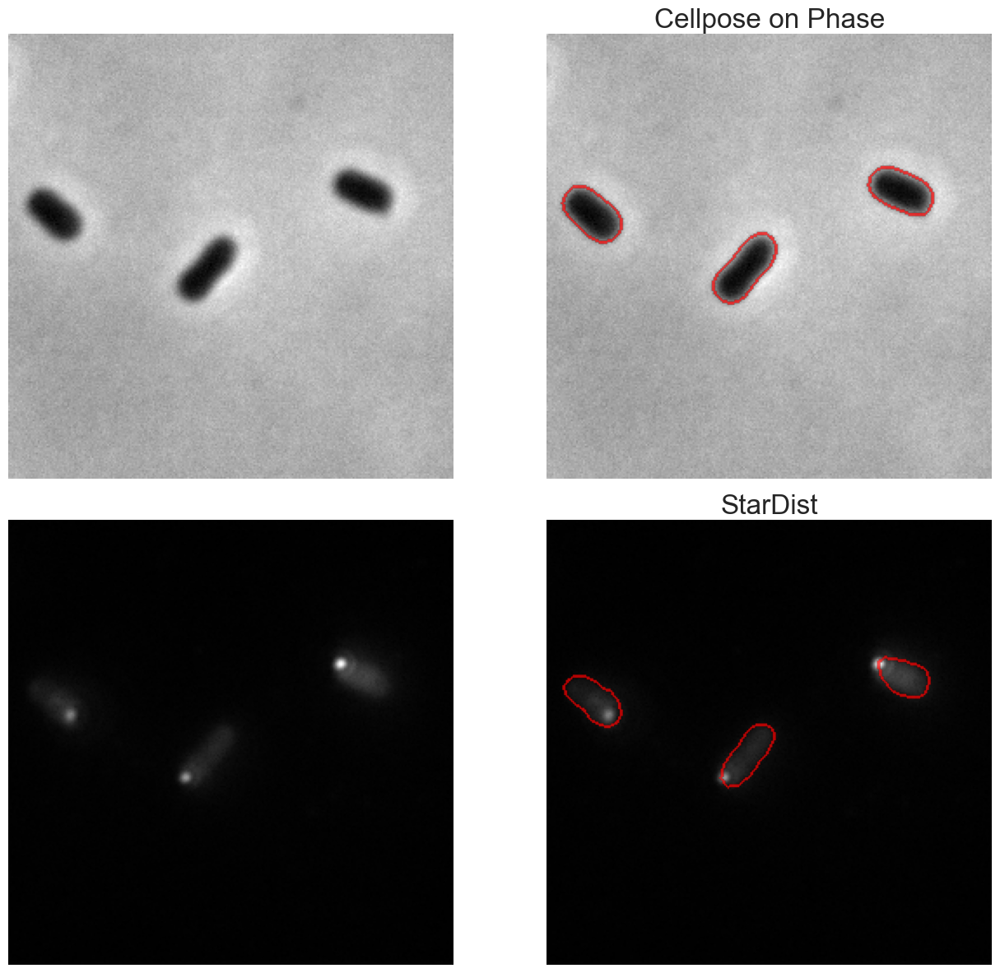

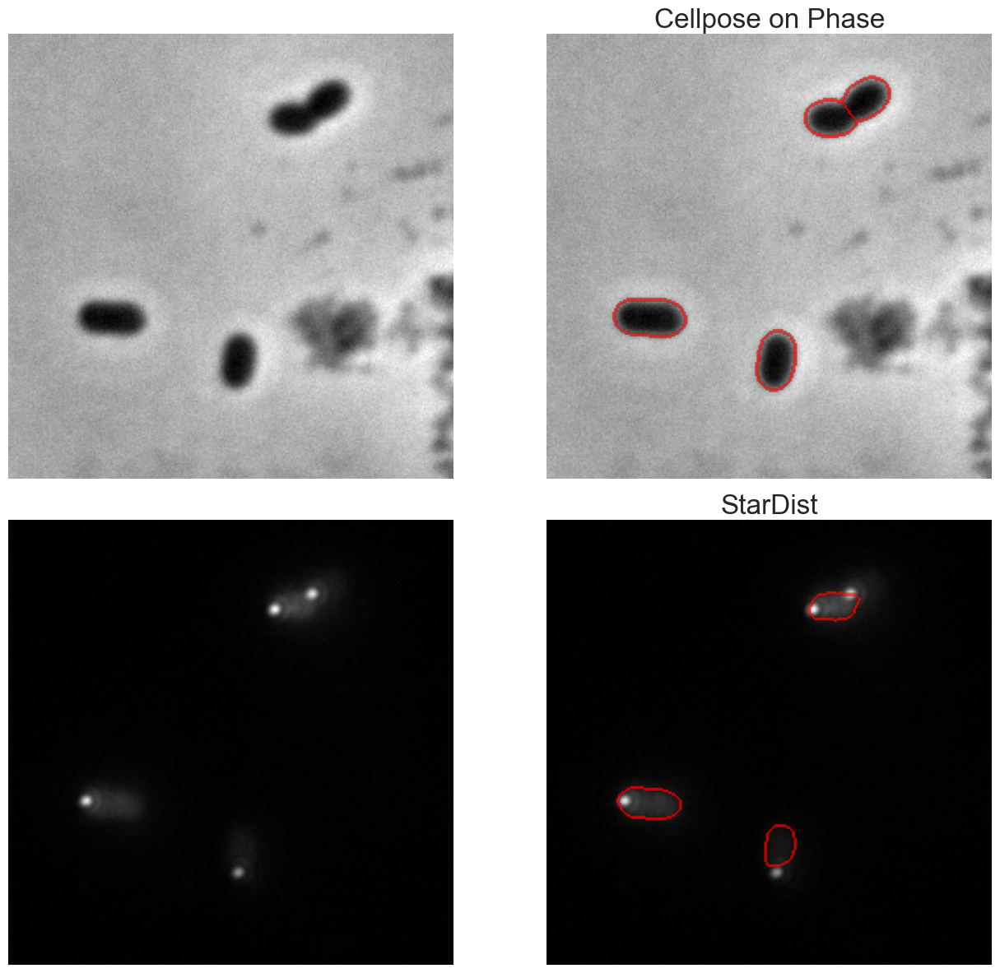

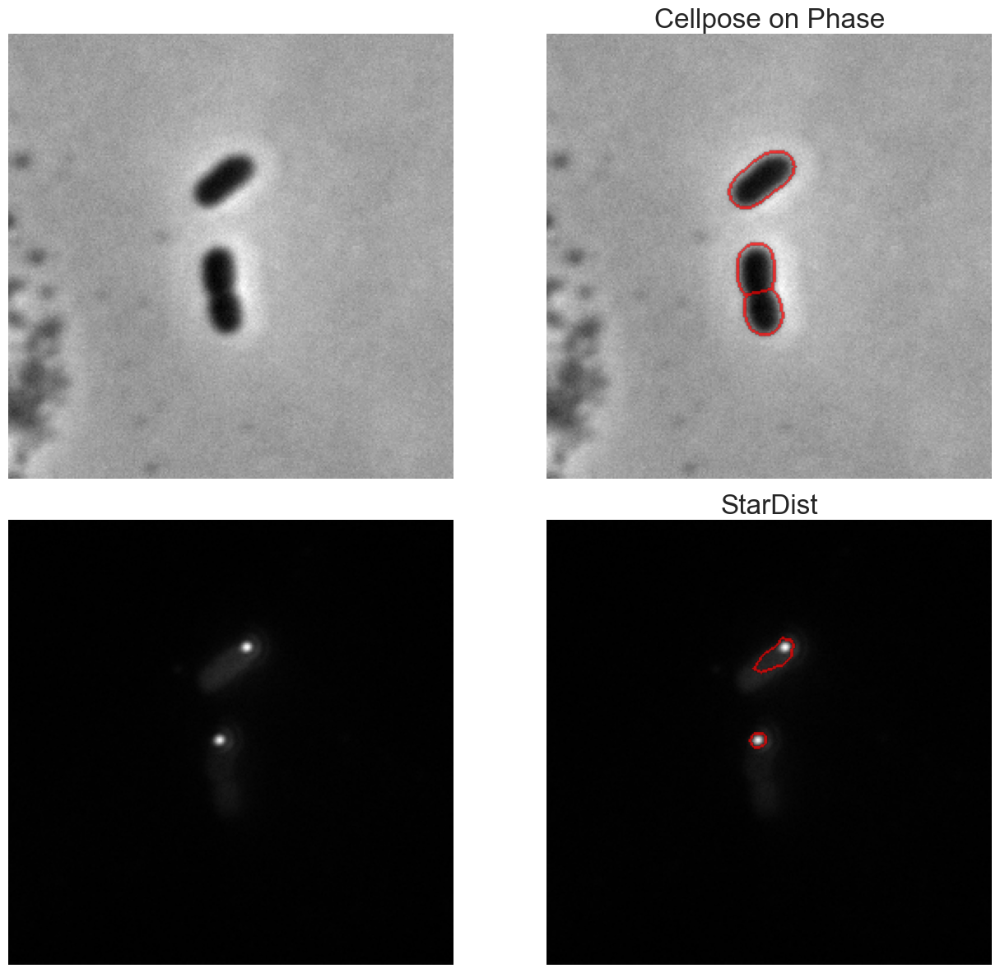

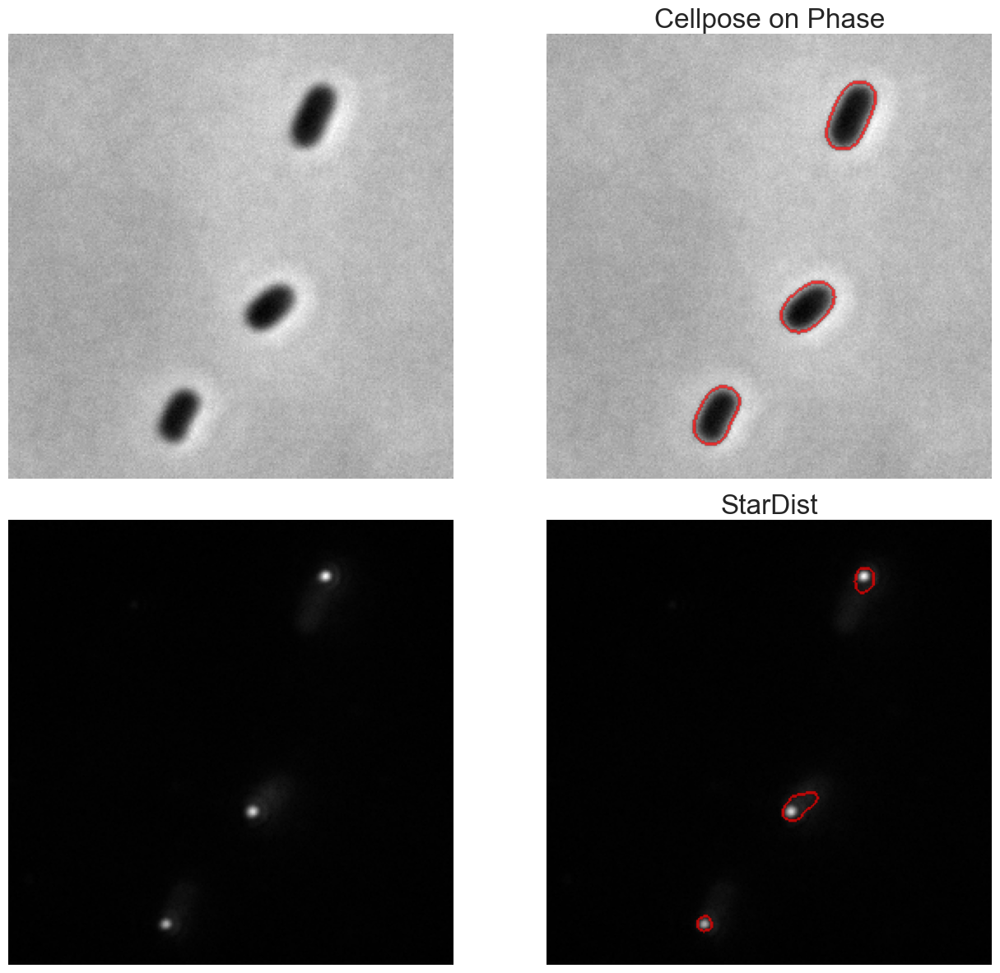

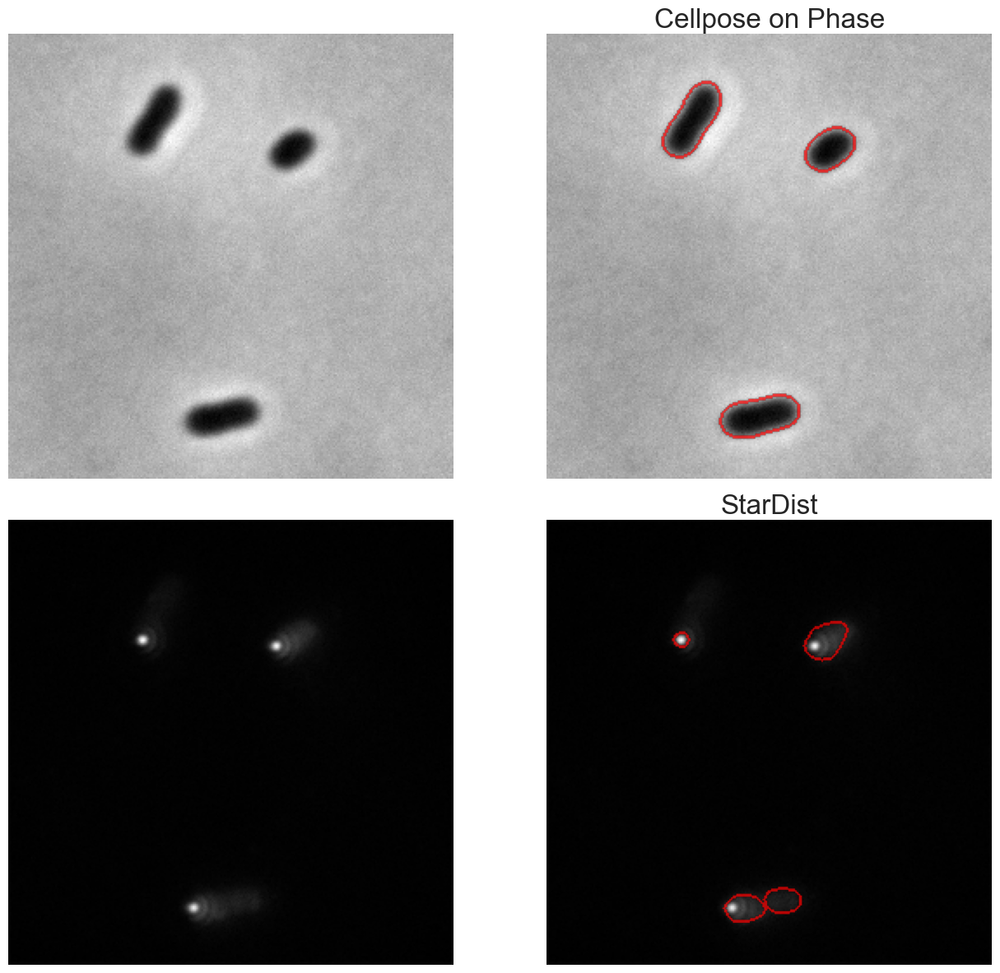

...

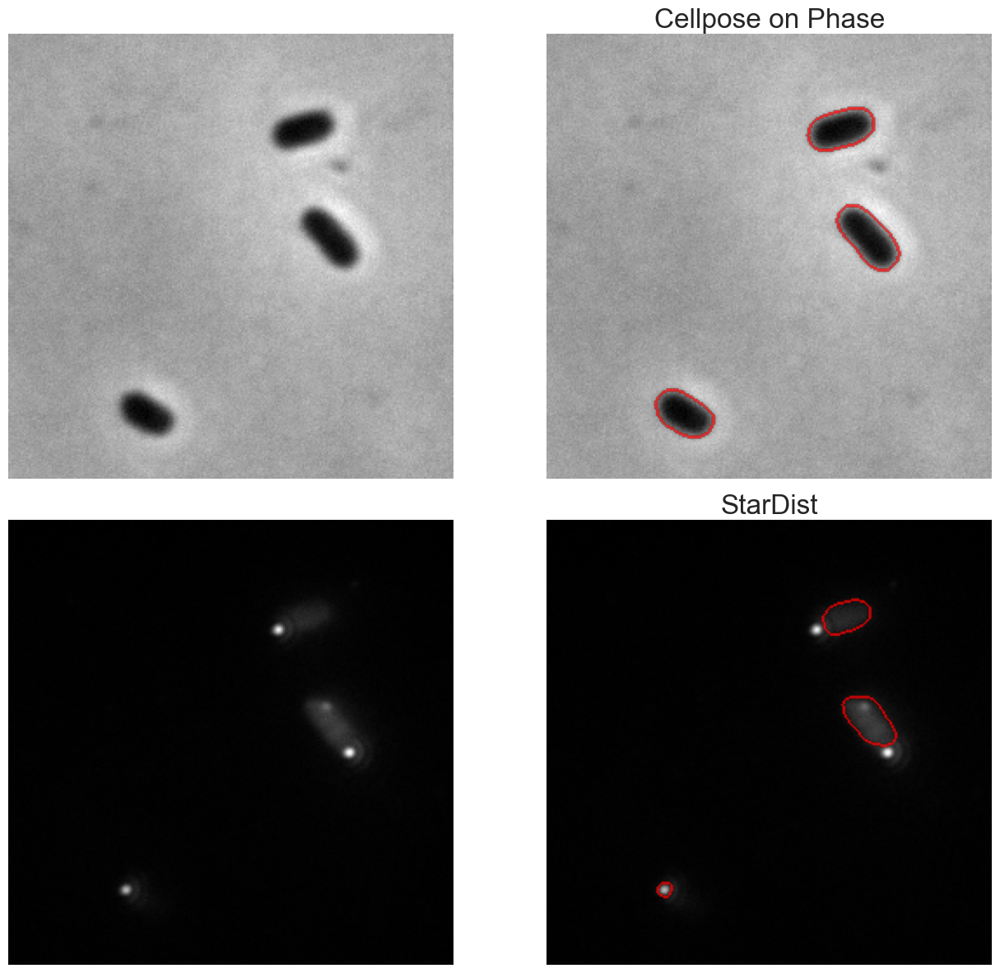

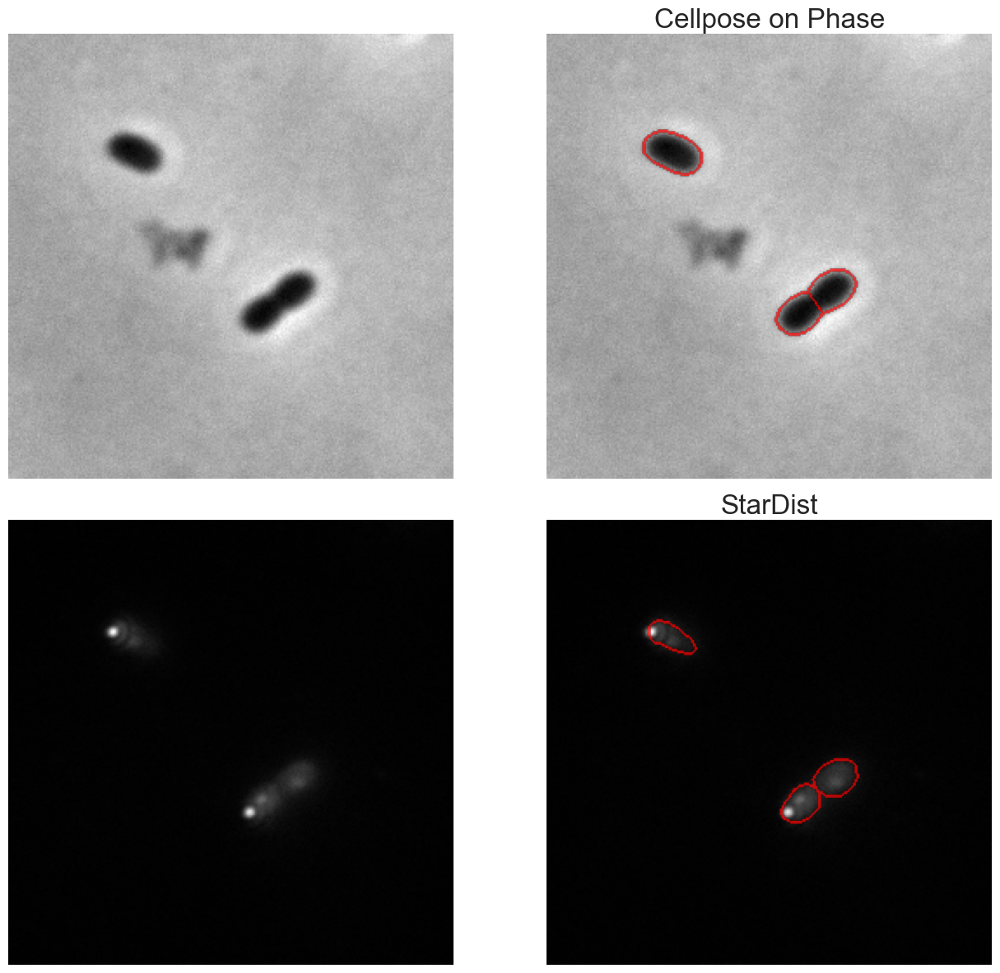

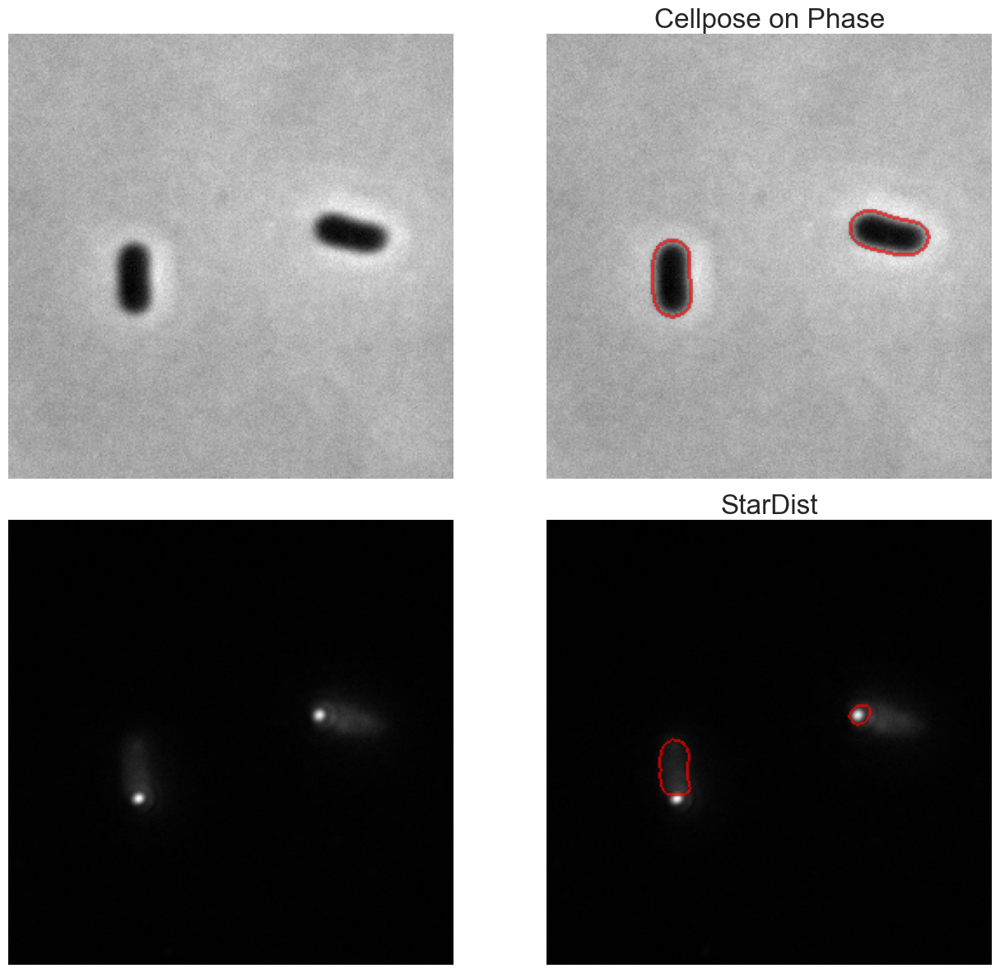

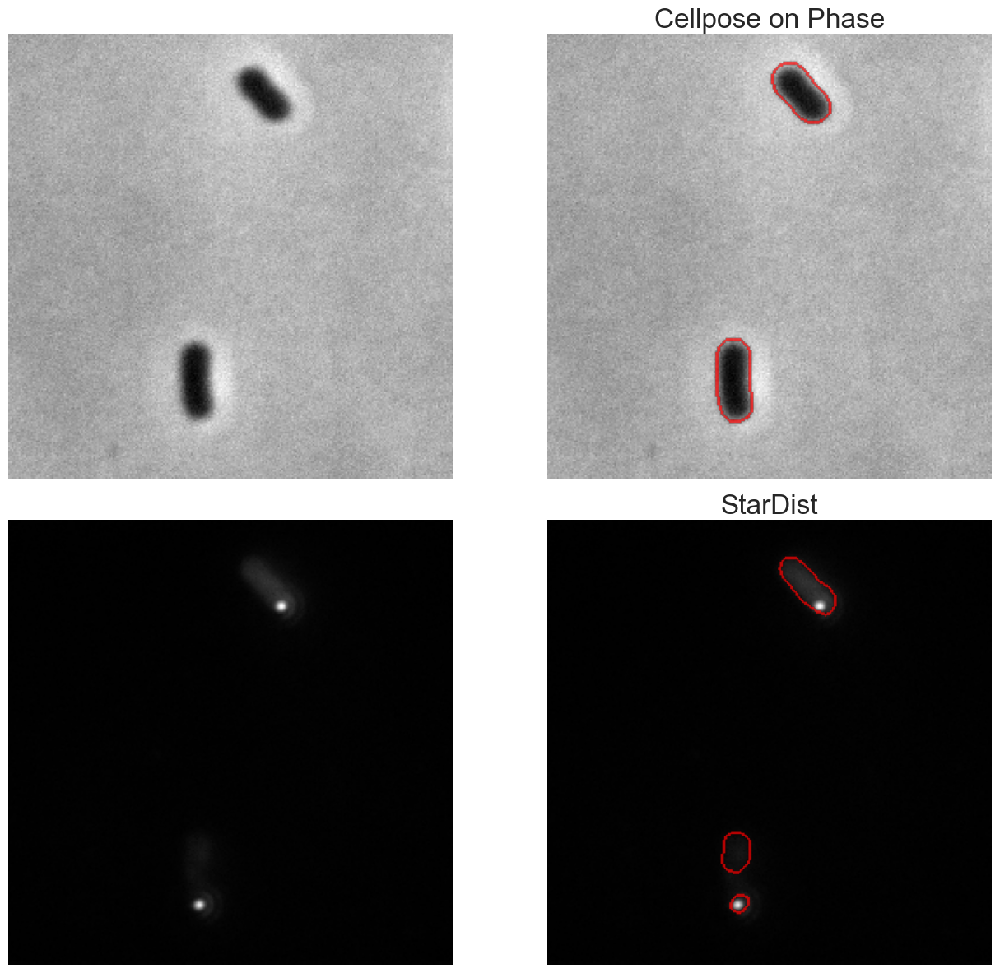

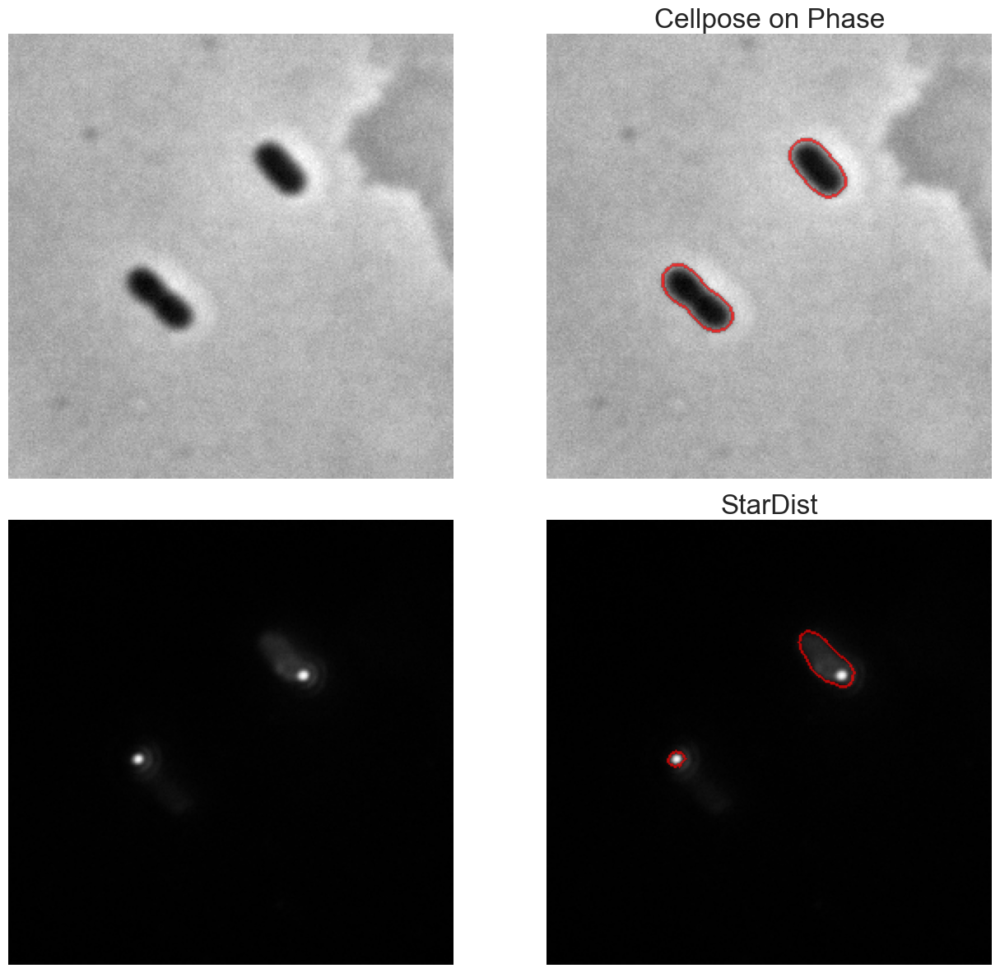

In [94]:
#for idx in target_indices:
#    plot_algorithm_compare(idx)
#    plot_4x4_comparison(idx)

#want ALL indices between 00001 and 00030. Use zfill for 5 digits. 
all_indices = [str(i).zfill(5) for i in range(1,36)]

for idx in all_indices:
    #plot_algorithm_compare(idx, gt = False)
    plot_4x4_comparison(idx, gt = False)

## Plots

In [95]:
#use pandas to read data in 
cp = pd.read_csv('cellpose_metrics.csv')
sd = pd.read_csv('stardist_metrics.csv')

# set seaborn theme
sns.set_theme(style="whitegrid")
cp_color = "blue" 
sd_color = "red" 

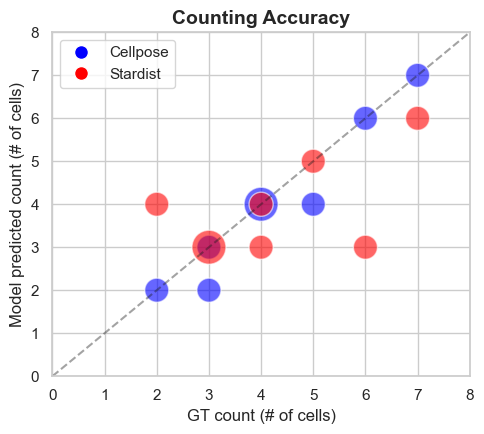

In [108]:
#detection correlation: in principle, if there are 5 GT cells, then there should be 5 predicted cells.
#Do deviations from this scale with more cells? 
#A bubble plot is nice to see variations in distributions.

#initialize plot
plt.figure(figsize=(5, 4.5))

#group counts 
cp_counts = cp.groupby(['gt_count', 'pred_count']).size().reset_index(name='count')
sd_counts = sd.groupby(['gt_count', 'pred_count']).size().reset_index(name='count')
max_count = max(cp['gt_count'].max(), cp['pred_count'].max(), sd['pred_count'].max()) + 2
plt.plot([0, max_count], [0, max_count], 'k--', alpha=0.4, label='Perfect Match')

plt.scatter(cp_counts['gt_count'], cp_counts['pred_count'], 
            color=cp_color, 
            s=cp_counts['count'] * 300, # Size scales with frequency
            label='Cellpose', alpha=0.6, edgecolors='w')

plt.scatter(sd_counts['gt_count'], sd_counts['pred_count'], 
            color=sd_color, 
            s=sd_counts['count'] * 300, # Size scales with frequency
            label='StarDist', alpha=0.6, edgecolors='w')

plt.title('Counting Accuracy', fontsize=14, fontweight='bold')
plt.xlim([0, 8])
plt.ylim([0, 8])
plt.xlabel('GT count (# of cells)')
plt.ylabel('Model predicted count (# of cells)')

# Optional: Add a legend entry to explain bubble size
from matplotlib.lines import Line2D
legend_elements = [
    Line2D([0], [0], marker='o', color='w', label='Cellpose', markerfacecolor=cp_color, markersize=10),
    Line2D([0], [0], marker='o', color='w', label='Stardist', markerfacecolor=sd_color, markersize=10),
    #Line2D([0], [0], marker='o', color='w', label='Bubble size = Frequency', markerfacecolor='gray', markersize=10)
]
plt.legend(handles=legend_elements)

plt.tight_layout()
plt.show()

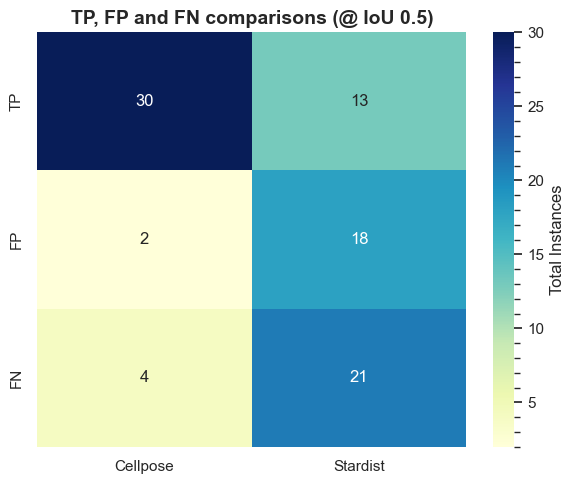

In [112]:
#error heatmap
plt.figure(figsize=(6, 5))
error_metrics = ['tp50', 'fp50', 'fn50']
breakdown = pd.DataFrame({
    'Cellpose': cp[error_metrics].sum().values,
    'Stardist': sd[error_metrics].sum().values
}, index=['TP', 'FP', 'FN'])

sns.heatmap(breakdown, annot=True, fmt='.0f', cmap='YlGnBu', cbar_kws={'label': 'Total Instances'})
plt.title('TP, FP and FN comparisons (@ IoU 0.5)', fontsize=14, fontweight='bold')
plt.tight_layout()
plt.show()

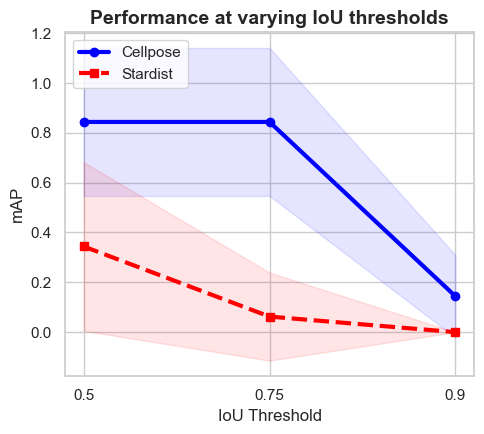

In [117]:
#performance at varying IoU thresholds
metrics = ['ap50', 'ap75', 'ap90']
labels = ['0.5', '0.75', '0.9']

cp_means = cp[metrics].mean()
sd_means = sd[metrics].mean()
cp_std = cp[metrics].std()
sd_std = sd[metrics].std()

plt.figure(figsize=(5, 4.5))
plt.plot(labels, cp_means, marker='o', 
         linewidth=3, color=cp_color, label='Cellpose')
plt.plot(labels, sd_means, marker='s', 
         linewidth=3, color=sd_color, linestyle='--', label='Stardist')

#using shaded region to display error
plt.fill_between(labels, cp_means - cp_std, cp_means + cp_std, color=cp_color, alpha=0.1)
plt.fill_between(labels, sd_means - sd_std, sd_means + sd_std, color=sd_color, alpha=0.1)

plt.ylabel('mAP')
plt.xlabel('IoU Threshold')
plt.title('Performance at varying IoU thresholds', fontsize=14, fontweight='bold')
plt.legend()
plt.tight_layout()
plt.show()